<a href="https://colab.research.google.com/github/hamdansyaif/DeepLearning/blob/main/Hands-On-ML2/Chapter-17/Chapter_17_autoencoders_dan_gans_full_terjemahan_fix.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Chapter 17 – Autoenkoder and GAN**

_This notebook contains all the sample code in chapter 17._

<table align="left">
  <td>
    <a href="https://colab.research.google.com/github/ageron/handson-ml2/blob/master/17_autoencoders_and_gans.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>
  </td>
  <td>
    <a target="_blank" href="https://kaggle.com/kernels/welcome?src=https://github.com/ageron/handson-ml2/blob/master/17_autoencoders_and_gans.ipynb"><img src="https://kaggle.com/static/images/open-in-kaggle.svg" /></a>
  </td>
</table>

# Setup

First, let's import a few common modules, ensure MatplotLib plots figures inline and prepare a function to save the figures. We also check that Python 3.5 or later is installed (although Python 2.x may work, it is deprecated so we strongly recommend you use Python 3 instead), as well as Scikit-Learn ≥0.20 and TensorFlow ≥2.0.

In [1]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Is this notebook running on Colab or Kaggle?
IS_COLAB = "google.colab" in sys.modules
IS_KAGGLE = "kaggle_secrets" in sys.modules

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# TensorFlow ≥2.0 is required
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"

if not tf.config.list_physical_devices('GPU'):
    print("Tidak ada GPU yang terdeteksi. LSTMs and CNNs bisa sangat lambat without a GPU.")
    if IS_COLAB:
        print("Buka menu Runtime > Ubah runtime and pilih GPU hardware accelerator.")
    if IS_KAGGLE:
        print("Go to Settings > Accelerator and select GPU.")

# Impor umum
import numpy as np
import os

# to make this notebook's keluaran stabil across runs
np.random.seed(42)
tf.random.set_seed(42)

# To plot pretty gambarures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Where to save the gambarures
DIREKTORI_PROYEK = "."
ID_BAB = "autoencoders"
PATH_GAMBAR = os.path.join(DIREKTORI_PROYEK, "images", ID_BAB)
os.makedirs(PATH_GAMBAR, exist_ok=True)

def simpan_gambar(id_gambar, tight_layout=True, gambar_ekstensi="png", resolution=300):
    jalur = os.path.join(PATH_GAMBAR, id_gambar + "." + gambar_ekstensi)
    print("Saving gambarure", id_gambar)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(jalur, format=gambar_ekstensi, dpi=resolution)

Tidak ada GPU yang terdeteksi. LSTMs and CNNs bisa sangat lambat without a GPU.
Buka menu Runtime > Ubah runtime and pilih GPU hardware accelerator.


A couple utility functions to plot grayscale 28x28 image:

In [2]:
def plot_image(image):
    plt.imshow(image, cmap="binary")
    plt.axis("off")

# PCA with a linear Autoencoder

Build 3D dataset:

In [3]:
np.random.seed(4)

def generate_3d_data(m, w1=0.1, w2=0.3, noise=0.1):
    angles = np.random.rand(m) * 3 * np.pi / 2 - 0.5
    data = np.empty((m, 3))
    data[:, 0] = np.cos(angles) + np.sin(angles)/2 + noise * np.random.randn(m) / 2
    data[:, 1] = np.sin(angles) * 0.7 + noise * np.random.randn(m) / 2
    data[:, 2] = data[:, 0] * w1 + data[:, 1] * w2 + noise * np.random.randn(m)
    return data

X_train = generate_3d_data(60)
X_train = X_train - X_train.mean(axis=0, keepdims=0)

Now let's build the Autoencoder...

In [4]:
np.random.seed(42)
tf.random.set_seed(42)

encoder = keras.models.Sequential([keras.layers.Dense(2, input_shape=[3])])
decoder = keras.models.Sequential([keras.layers.Dense(3, input_shape=[2])])
autoencoder = keras.models.Sequential([encoder, decoder])

autoencoder.compile(loss="mse", optimizer=keras.optimizers.SGD(learning_rate=1.5))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [5]:
history = autoencoder.fit(X_train, X_train, epochs=20)

Epoch 1/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.8853 
Epoch 2/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.2149 
Epoch 3/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0755
Epoch 4/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0610 
Epoch 5/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0616
Epoch 6/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0679
Epoch 7/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0712 
Epoch 8/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0636
Epoch 9/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0513 
Epoch 10/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0411
Epoch 11/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0334 
Epoch 12/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0270
Epoch 13/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0214 
Epoch 14/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0168
Epoch 15/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0133
Epoch 16/20
2/2 ━━━━━━━━

In [6]:
codings = encoder.predict(X_train)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step 


Saving gambarure linear_autoencoder_pca_plot


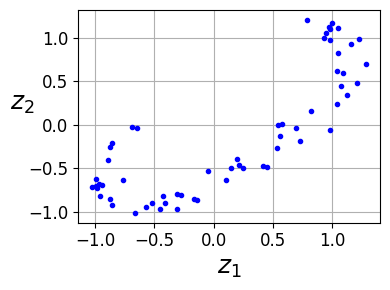

In [7]:
gambar = plt.figure(figsize=(4,3))
plt.plot(codings[:,0], codings[:, 1], "b.")
plt.xlabel("$z_1$", fontsize=18)
plt.ylabel("$z_2$", fontsize=18, rotation=0)
plt.grid(True)
simpan_gambar("linear_autoencoder_pca_plot")
plt.show()

# Stacked Autoenkoder

Let's use MNIST:

In [8]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

29515/29515 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
26421880/26421880 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
5148/5148 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
4422102/4422102 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


## Train all layers at once

Let's build a stacked Autoencoder with 3 hidden layers and 1 output layer (i.e., 2 stacked Autoenkoder).

In [9]:
def rounded_accuracy(y_true, y_pred):
    return keras.metrics.binary_accuracy(tf.round(y_true), tf.round(y_pred))

In [10]:
tf.random.set_seed(42)
np.random.seed(42)

stacked_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu"),
])
stacked_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
stacked_ae = keras.models.Sequential([stacked_encoder, stacked_decoder])
stacked_ae.compile(loss="binary_crossentropy",
                   optimizer=keras.optimizers.SGD(learning_rate=1.5), metrics=[rounded_accuracy])
history = stacked_ae.fit(X_train, X_train, epochs=20,
                         validation_data=(X_valid, X_valid))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.3808 - rounded_accuracy: 0.8490 - val_loss: 0.3116 - val_rounded_accuracy: 0.9085
Epoch 2/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.3054 - rounded_accuracy: 0.9152 - val_loss: 0.3005 - val_rounded_accuracy: 0.9212
Epoch 3/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - loss: 0.2976 - rounded_accuracy: 0.9222 - val_loss: 0.2959 - val_rounded_accuracy: 0.9249
Epoch 4/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 13s 7ms/step - loss: 0.2931 - rounded_accuracy: 0.9263 - val_loss: 0.2926 - val_rounded_accuracy: 0.9289
Epoch 5/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - loss: 0.2903 - rounded_accuracy: 0.9288 - val_loss: 0.2907 - val_rounded_accuracy: 0.9318
Epoch 6/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - loss: 0.2884 - rounded_accuracy: 0.9306 - val_loss: 0.2897 - val_rounded_accuracy: 0.9327
Epoch 7/20
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.2869 - rounded_accuracy: 0.9319 - val_loss: 0.2883 - v

This function processes a few test images through the autoencoder and displays the original images and their reconstructions:

In [11]:
def show_reconstructions(model, images=X_valid, n_images=5):
    reconstructions = model.predict(images[:n_images])
    gambar = plt.figure(figsize=(n_images * 1.5, 3))
    for image_index in range(n_images):
        plt.subplot(2, n_images, 1 + image_index)
        plot_image(images[image_index])
        plt.subplot(2, n_images, 1 + n_images + image_index)
        plot_image(reconstructions[image_index])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
Saving gambarure reconstruction_plot


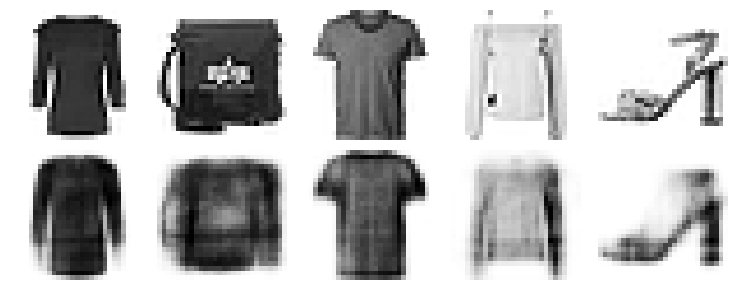

In [12]:
show_reconstructions(stacked_ae)
simpan_gambar("reconstruction_plot")

# Visualizing Fashion MNIST

In [13]:
np.random.seed(42)

from sklearn.manifold import TSNE

X_valid_compressed = stacked_encoder.predict(X_valid)
tsne = TSNE()
X_valid_2D = tsne.fit_transform(X_valid_compressed)
X_valid_2D = (X_valid_2D - X_valid_2D.min()) / (X_valid_2D.max() - X_valid_2D.min())

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


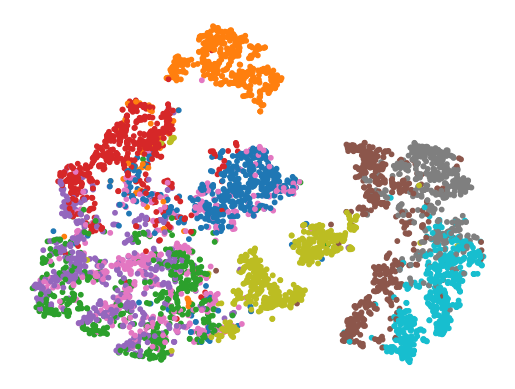

In [14]:
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap="tab10")
plt.axis("off")
plt.show()

Let's make this diagram a bit prettier:

Saving gambarure fashion_mnist_visualization_plot


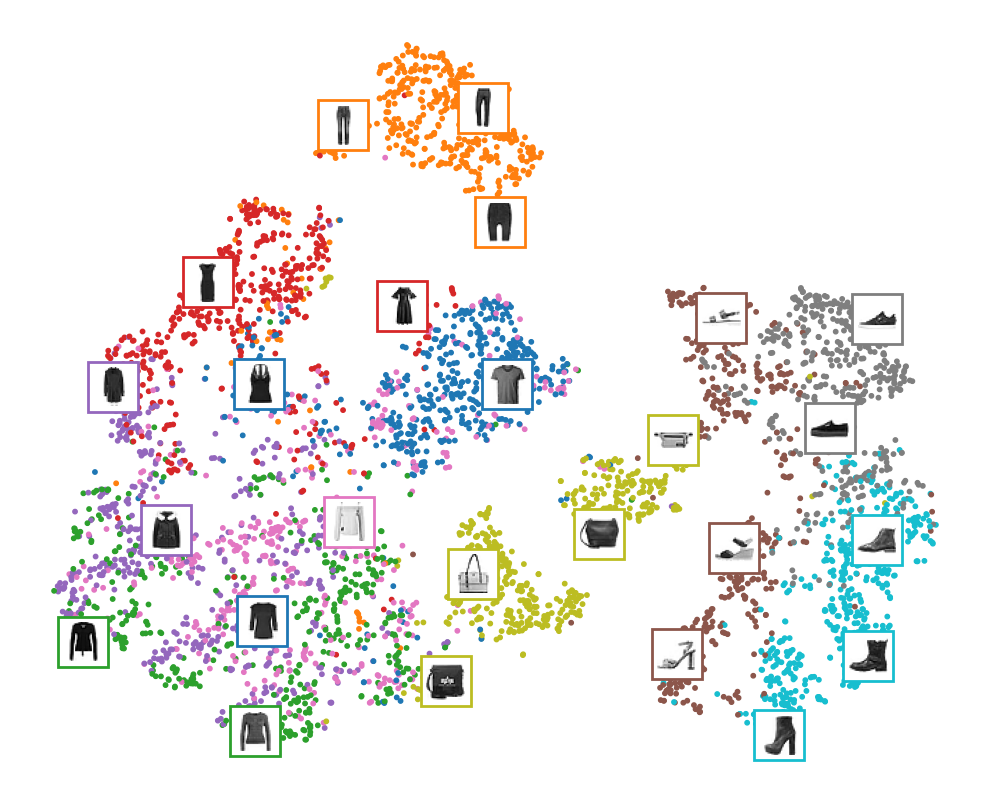

In [15]:
# adapted from https://scikit-learn.org/stable/auto_examples/manifold/plot_lle_digits.html
plt.figure(figsize=(10, 8))
cmap = plt.cm.tab10
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap=cmap)
image_positions = np.array([[1., 1.]])
for index, position in enumerate(X_valid_2D):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(X_valid[index], cmap="binary"),
            position, bboxprops={"edgecolor": cmap(y_valid[index]), "lw": 2})
        plt.gca().add_artist(imagebox)
plt.axis("off")
simpan_gambar("fashion_mnist_visualization_plot")
plt.show()

## Tying weights

It is common to tie the weights of the pengenkode and the pengurai, by simply using the transpose of the pengenkode's weights as the pengurai weights. For this, we need to use a custom layer.

In [18]:
class DenseTranspose(keras.layers.Layer):
    def __init__(self, dense, activation=None, **kwargs):
        super().__init__(**kwargs)
        self.dense = dense
        self.activation = keras.activations.get(activation)

    def build(self, batch_input_shape):
        # Ambil bobot dari layer Dense yang ditranspos
        self.weights_ = self.dense.weights[0]
        # Ambil jumlah neuron dari layer Dense yang asli
        output_dim = self.weights_.shape[0]  # transpose dari dimensi out
        self.biases = self.add_weight(name="bias", shape=[output_dim],
                                      initializer="zeros")
        super().build(batch_input_shape)

    def call(self, inputs):
        z = tf.matmul(inputs, tf.transpose(self.weights_))
        return self.activation(z + self.biases)


In [19]:
keras.backend.clear_session()
tf.random.set_seed(42)
np.random.seed(42)

dense_1 = keras.layers.Dense(100, activation="selu")
dense_2 = keras.layers.Dense(30, activation="selu")

tied_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    dense_1,
    dense_2
])

tied_decoder = keras.models.Sequential([
    DenseTranspose(dense_2, activation="selu"),
    DenseTranspose(dense_1, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

tied_ae = keras.models.Sequential([tied_encoder, tied_decoder])

tied_ae.compile(loss="binary_crossentropy",
                optimizer=keras.optimizers.SGD(learning_rate=1.5), metrics=[rounded_accuracy])
history = tied_ae.fit(X_train, X_train, epochs=10,
                      validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.3717 - rounded_accuracy: 0.8566 - val_loss: 0.3113 - val_rounded_accuracy: 0.9021
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.3013 - rounded_accuracy: 0.9183 - val_loss: 0.3010 - val_rounded_accuracy: 0.9137
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.2941 - rounded_accuracy: 0.9250 - val_loss: 0.2983 - val_rounded_accuracy: 0.9153
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - loss: 0.2905 - rounded_accuracy: 0.9282 - val_loss: 0.2942 - val_rounded_accuracy: 0.9206
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.2882 - rounded_accuracy: 0.9303 - val_loss: 0.2922 - val_rounded_accuracy: 0.9229
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 18s 11ms/step - loss: 0.2865 - rounded_accuracy: 0.9317 - val_loss: 0.2910 - val_rounded_accuracy: 0.9239
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 13s 6ms/step - loss: 0.2852 - rounded_accuracy: 0.9329 - val_loss: 0.2902 - 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


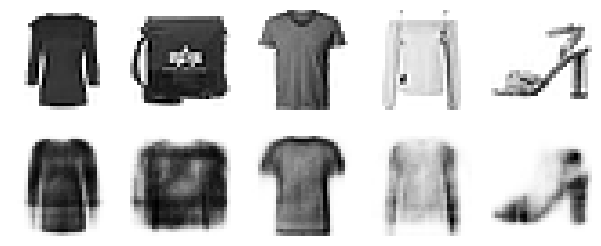

In [20]:
show_reconstructions(tied_ae)
plt.show()

## pelatihan one Autoencoder at a Time

In [21]:
def train_autoencoder(n_neurons, X_train, X_valid, loss, optimizer,
                      n_epochs=10, output_activation=None, metrics=None):
    n_inputs = X_train.shape[-1]
    encoder = keras.models.Sequential([
        keras.layers.Dense(n_neurons, activation="selu", input_shape=[n_inputs])
    ])
    decoder = keras.models.Sequential([
        keras.layers.Dense(n_inputs, activation=output_activation),
    ])
    autoencoder = keras.models.Sequential([encoder, decoder])
    autoencoder.compile(optimizer, loss, metrics=metrics)
    autoencoder.fit(X_train, X_train, epochs=n_epochs,
                    validation_data=(X_valid, X_valid))
    return encoder, decoder, encoder(X_train), encoder(X_valid)

In [22]:
tf.random.set_seed(42)
np.random.seed(42)

K = keras.backend
X_train_flat = K.batch_flatten(X_train) # equivalent to .reshape(-1, 28 * 28)
X_valid_flat = K.batch_flatten(X_valid)
enc1, dec1, X_train_enc1, X_valid_enc1 = train_autoencoder(
    100, X_train_flat, X_valid_flat, "binary_crossentropy",
    keras.optimizers.SGD(learning_rate=1.5), output_activation="sigmoid",
    metrics=[rounded_accuracy])
enc2, dec2, _, _ = train_autoencoder(
    30, X_train_enc1, X_valid_enc1, "mse", keras.optimizers.SGD(learning_rate=0.05),
    output_activation="selu")

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1719/1719 ━━━━━━━━━━━━━━━━━━━━ 13s 7ms/step - loss: 0.3960 - rounded_accuracy: 0.8453 - val_loss: 0.3121 - val_rounded_accuracy: 0.9150
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 18s 5ms/step - loss: 0.3064 - rounded_accuracy: 0.9180 - val_loss: 0.3008 - val_rounded_accuracy: 0.9244
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - loss: 0.2968 - rounded_accuracy: 0.9265 - val_loss: 0.2940 - val_rounded_accuracy: 0.9309
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.2906 - rounded_accuracy: 0.9323 - val_loss: 0.2894 - val_rounded_accuracy: 0.9353
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - loss: 0.2865 - rounded_accuracy: 0.9363 - val_loss: 0.2862 - val_rounded_accuracy: 0.9385
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.2835 - rounded_accuracy: 0.9391 - val_loss: 0.2839 - val_rounded_accuracy: 0.9408
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 9s 5ms/step - loss: 0.2814 - rounded_accuracy: 0.9412 - val_loss: 0.2821 - val_rounded_a

In [23]:
stacked_ae_1_by_1 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    enc1, enc2, dec2, dec1,
    keras.layers.Reshape([28, 28])
])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


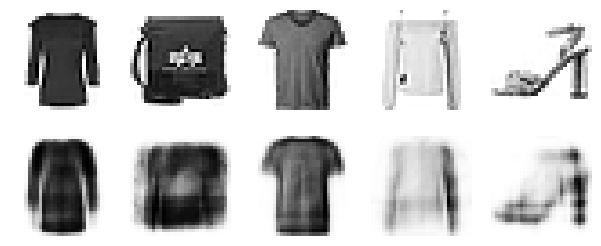

In [24]:
show_reconstructions(stacked_ae_1_by_1)
plt.show()

In [25]:
stacked_ae_1_by_1.compile(loss="binary_crossentropy",
                          optimizer=keras.optimizers.SGD(learning_rate=0.1), metrics=[rounded_accuracy])
history = stacked_ae_1_by_1.fit(X_train, X_train, epochs=10,
                                validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.2850 - rounded_accuracy: 0.9359 - val_loss: 0.2867 - val_rounded_accuracy: 0.9364
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.2846 - rounded_accuracy: 0.9364 - val_loss: 0.2865 - val_rounded_accuracy: 0.9366
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.2844 - rounded_accuracy: 0.9366 - val_loss: 0.2864 - val_rounded_accuracy: 0.9368
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.2843 - rounded_accuracy: 0.9367 - val_loss: 0.2862 - val_rounded_accuracy: 0.9369
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.2842 - rounded_accuracy: 0.9368 - val_loss: 0.2861 - val_rounded_accuracy: 0.9370
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - loss: 0.2841 - rounded_accuracy: 0.9369 - val_loss: 0.2860 - val_rounded_accuracy: 0.9371
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 19s 6ms/step - loss: 0.2840 - rounded_accuracy: 0.9370 - val_loss: 0.2860 - 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


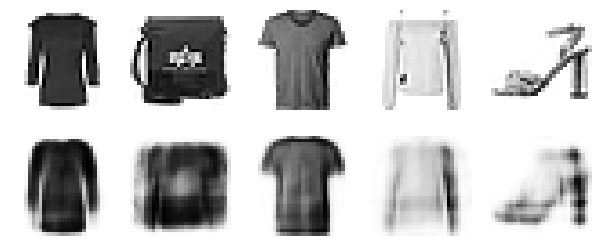

In [26]:
show_reconstructions(stacked_ae_1_by_1)
plt.show()

## Using Convolutional Layers Instead of Dense Layers

Let's build a stacked Autoencoder with 3 hidden layers and 1 output layer (i.e., 2 stacked Autoenkoder).

In [27]:
tf.random.set_seed(42)
np.random.seed(42)

conv_encoder = keras.models.Sequential([
    keras.layers.Reshape([28, 28, 1], input_shape=[28, 28]),
    keras.layers.Conv2D(16, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(32, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(64, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2)
])
conv_decoder = keras.models.Sequential([
    keras.layers.Conv2DTranspose(32, kernel_size=3, strides=2, padding="VALID", activation="selu",
                                 input_shape=[3, 3, 64]),
    keras.layers.Conv2DTranspose(16, kernel_size=3, strides=2, padding="SAME", activation="selu"),
    keras.layers.Conv2DTranspose(1, kernel_size=3, strides=2, padding="SAME", activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
conv_ae = keras.models.Sequential([conv_encoder, conv_decoder])

conv_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
                metrics=[rounded_accuracy])
history = conv_ae.fit(X_train, X_train, epochs=5,
                      validation_data=(X_valid, X_valid))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv_transpose.py:94: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Epoch 1/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 65s 37ms/step - loss: 0.3360 - rounded_accuracy: 0.8898 - val_loss: 0.2813 - val_rounded_accuracy: 0.9352
Epoch 2/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 64s 37ms/step - loss: 0.2766 - rounded_accuracy: 0.9402 - val_loss: 0.2758 - val_rounded_accuracy: 0.9405
Epoch 3/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 80s 36ms/step - loss: 0.2712 - rounded_accuracy: 0.9454 - val_loss: 0.2711 - val_rounded_accuracy: 0.9461
Epoch 4/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 83s 37ms/step - loss: 0.2684 - rounded_accuracy: 0.9483 - val_loss: 0.2686 - val_rounded_accuracy: 0.9495
Epoch 5/5
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 86s 39ms/step - loss: 0.2665 - rounded_accuracy: 0.9503 - val_loss: 0.2671 - val_rounded_accuracy: 0.9517


In [28]:
conv_encoder.summary()
conv_decoder.summary()

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape_2 (Reshape)             │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 28, 28, 16)     │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 14, 14, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 14, 14, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 7, 7, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 7, 7, 64)       │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 3, 3, 64)       │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,296 (91.00 KB)

 Trainable params: 23,296 (91.00 KB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_transpose                │ (None, 7, 7, 32)       │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 14, 14, 16)     │         4,624 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 28, 28, 1)      │           145 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_3 (Reshape)             │ (None, 28, 28)         │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,233 (90.75 KB)

 Trainable params: 23,233 (90.75 KB)

 Non-trainable params: 0 (0.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


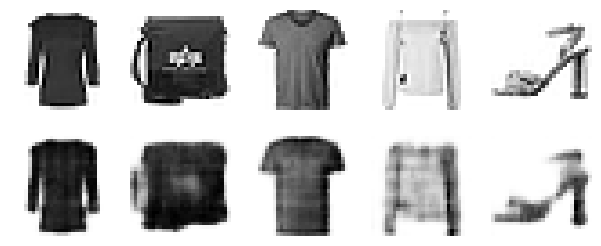

In [29]:
show_reconstructions(conv_ae)
plt.show()

# Recurrent Autoenkoder

In [30]:
recurrent_encoder = keras.models.Sequential([
    keras.layers.LSTM(100, return_sequences=True, input_shape=[28, 28]),
    keras.layers.LSTM(30)
])
recurrent_decoder = keras.models.Sequential([
    keras.layers.RepeatVector(28, input_shape=[30]),
    keras.layers.LSTM(100, return_sequences=True),
    keras.layers.TimeDistributed(keras.layers.Dense(28, activation="sigmoid"))
])
recurrent_ae = keras.models.Sequential([recurrent_encoder, recurrent_decoder])
recurrent_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(0.1),
                     metrics=[rounded_accuracy])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/repeat_vector.py:29: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [31]:
history = recurrent_ae.fit(X_train, X_train, epochs=10, validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 119s 66ms/step - loss: 0.5486 - rounded_accuracy: 0.7301 - val_loss: 0.4284 - val_rounded_accuracy: 0.8263
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 112s 65ms/step - loss: 0.4069 - rounded_accuracy: 0.8410 - val_loss: 0.3730 - val_rounded_accuracy: 0.8663
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 145s 67ms/step - loss: 0.3678 - rounded_accuracy: 0.8680 - val_loss: 0.3578 - val_rounded_accuracy: 0.8782
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 141s 67ms/step - loss: 0.3544 - rounded_accuracy: 0.8791 - val_loss: 0.3544 - val_rounded_accuracy: 0.8807
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 145s 69ms/step - loss: 0.3444 - rounded_accuracy: 0.8845 - val_loss: 0.3438 - val_rounded_accuracy: 0.8863
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 116s 67ms/step - loss: 0.3361 - rounded_accuracy: 0.8898 - val_loss: 0.3316 - val_rounded_accuracy: 0.8942
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 141s 67ms/step - loss: 0.3303 - rounded_accuracy: 0.8938 - val_l

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


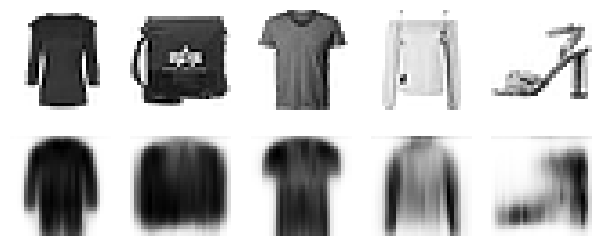

In [32]:
show_reconstructions(recurrent_ae)
plt.show()

# Stacked denoising Autoencoder

Using Gaussian noise:

In [33]:
tf.random.set_seed(42)
np.random.seed(42)

denoising_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.GaussianNoise(0.2),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu")
])
denoising_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
denoising_ae = keras.models.Sequential([denoising_encoder, denoising_decoder])
denoising_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
                     metrics=[rounded_accuracy])
history = denoising_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 13s 7ms/step - loss: 0.3992 - rounded_accuracy: 0.8331 - val_loss: 0.3182 - val_rounded_accuracy: 0.9062
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - loss: 0.3145 - rounded_accuracy: 0.9075 - val_loss: 0.3073 - val_rounded_accuracy: 0.9151
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - loss: 0.3058 - rounded_accuracy: 0.9150 - val_loss: 0.3038 - val_rounded_accuracy: 0.9217
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - loss: 0.3014 - rounded_accuracy: 0.9189 - val_loss: 0.3007 - val_rounded_accuracy: 0.9247
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - loss: 0.2983 - rounded_accuracy: 0.9216 - val_loss: 0.2961 - val_rounded_accuracy: 0.9256
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - loss: 0.2963 - rounded_accuracy: 0.9233 - val_loss: 0.2946 - val_rounded_accuracy: 0.9261
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - loss: 0.2947 - rounded_accuracy: 0.9247 - val_loss: 0.2932 - 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


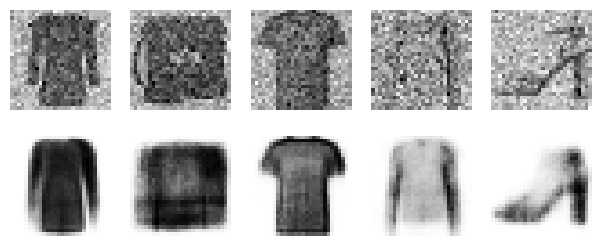

In [34]:
tf.random.set_seed(42)
np.random.seed(42)

noise = keras.layers.GaussianNoise(0.2)
show_reconstructions(denoising_ae, noise(X_valid, training=True))
plt.show()

Using dropout:

In [35]:
tf.random.set_seed(42)
np.random.seed(42)

dropout_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu")
])
dropout_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
dropout_ae = keras.models.Sequential([dropout_encoder, dropout_decoder])
dropout_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
                   metrics=[rounded_accuracy])
history = dropout_ae.fit(X_train, X_train, epochs=10,
                         validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - loss: 0.4066 - rounded_accuracy: 0.8278 - val_loss: 0.3233 - val_rounded_accuracy: 0.9045
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.3201 - rounded_accuracy: 0.9011 - val_loss: 0.3138 - val_rounded_accuracy: 0.9116
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 19s 6ms/step - loss: 0.3126 - rounded_accuracy: 0.9074 - val_loss: 0.3072 - val_rounded_accuracy: 0.9167
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.3087 - rounded_accuracy: 0.9105 - val_loss: 0.3042 - val_rounded_accuracy: 0.9179
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - loss: 0.3064 - rounded_accuracy: 0.9123 - val_loss: 0.3016 - val_rounded_accuracy: 0.9204
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - loss: 0.3043 - rounded_accuracy: 0.9140 - val_loss: 0.3000 - val_rounded_accuracy: 0.9212
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - loss: 0.3028 - rounded_accuracy: 0.9154 - val_loss: 0.2990 - 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
Saving gambarure dropout_denoising_plot


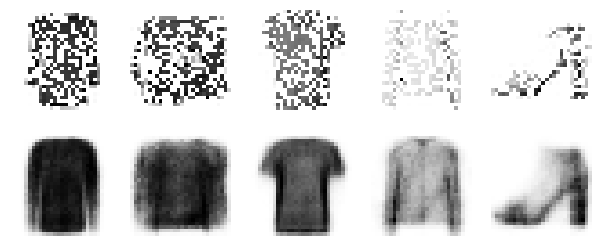

In [36]:
tf.random.set_seed(42)
np.random.seed(42)

dropout = keras.layers.Dropout(0.5)
show_reconstructions(dropout_ae, dropout(X_valid, training=True))
simpan_gambar("dropout_denoising_plot", tight_layout=False)

# Sparse Autoencoder

Let's build a simple stacked autoencoder, so we can compare it to the sparse Autoenkoder we will build. This time Kita akan menggunakan the sigmoid activation function for the coding layer, to ensure that the coding values range from 0 to 1:

In [37]:
tf.random.set_seed(42)
np.random.seed(42)

simple_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="sigmoid"),
])
simple_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
simple_ae = keras.models.Sequential([simple_encoder, simple_decoder])
simple_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.),
                  metrics=[rounded_accuracy])
history = simple_ae.fit(X_train, X_train, epochs=10,
                        validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - loss: 0.4878 - rounded_accuracy: 0.7440 - val_loss: 0.3786 - val_rounded_accuracy: 0.8469
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.3704 - rounded_accuracy: 0.8558 - val_loss: 0.3546 - val_rounded_accuracy: 0.8753
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.3465 - rounded_accuracy: 0.8821 - val_loss: 0.3372 - val_rounded_accuracy: 0.8909
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.3314 - rounded_accuracy: 0.8942 - val_loss: 0.3261 - val_rounded_accuracy: 0.8992
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.3226 - rounded_accuracy: 0.9009 - val_loss: 0.3211 - val_rounded_accuracy: 0.9031
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.3181 - rounded_accuracy: 0.9041 - val_loss: 0.3180 - val_rounded_accuracy: 0.9040
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.3148 - rounded_accuracy: 0.9068 - val_loss: 0.3151 - 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


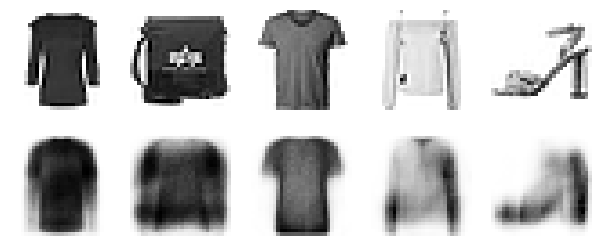

In [38]:
show_reconstructions(simple_ae)
plt.show()

Let's create a couple functions to print nice activation histograms:

In [39]:
def plot_percent_hist(ax, data, bins):
    counts, _ = np.histogram(data, bins=bins)
    widths = bins[1:] - bins[:-1]
    x = bins[:-1] + widths / 2
    ax.bar(x, counts / len(data), width=widths*0.8)
    ax.xaxis.set_ticks(bins)
    ax.yaxis.set_major_formatter(mpl.ticker.FuncFormatter(
        lambda y, position: "{}%".format(int(np.round(100 * y)))))
    ax.grid(True)

In [40]:
def plot_activations_histogram(encoder, height=1, n_bins=10):
    X_valid_codings = encoder(X_valid).numpy()
    activation_means = X_valid_codings.mean(axis=0)
    mean = activation_means.mean()
    bins = np.linspace(0, 1, n_bins + 1)

    gambar, [ax1, ax2] = plt.subplots(figsize=(10, 3), nrows=1, ncols=2, sharey=True)
    plot_percent_hist(ax1, X_valid_codings.ravel(), bins)
    ax1.plot([mean, mean], [0, height], "k--", label="Overall Mean = {:.2f}".format(mean))
    ax1.legend(loc="upper center", fontsize=14)
    ax1.set_xlabel("Activation")
    ax1.set_ylabel("% Activations")
    ax1.axis([0, 1, 0, height])
    plot_percent_hist(ax2, activation_means, bins)
    ax2.plot([mean, mean], [0, height], "k--")
    ax2.set_xlabel("Neuron Mean Activation")
    ax2.set_ylabel("% Neurons")
    ax2.axis([0, 1, 0, height])

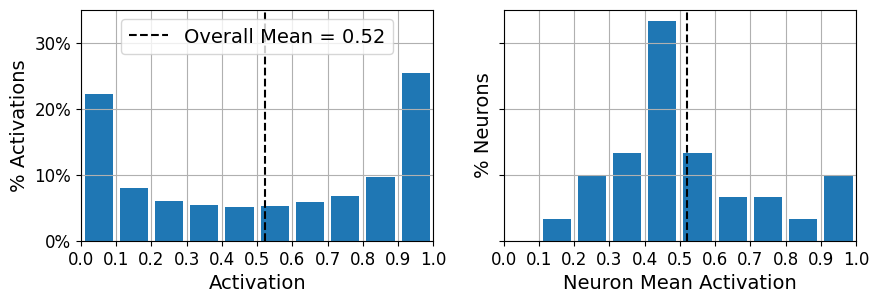

In [41]:
plot_activations_histogram(simple_encoder, height=0.35)
plt.show()

Now let's add $\ell_1$ regularization to the coding layer:

In [42]:
tf.random.set_seed(42)
np.random.seed(42)

sparse_l1_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(300, activation="sigmoid"),
    keras.layers.ActivityRegularization(l1=1e-3)  # Alternatively, you could add
                                                  # activity_regularizer=keras.regularizers.l1(1e-3)
                                                  # to the previous layer.
])
sparse_l1_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[300]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
sparse_l1_ae = keras.models.Sequential([sparse_l1_encoder, sparse_l1_decoder])
sparse_l1_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
                     metrics=[rounded_accuracy])
history = sparse_l1_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - loss: 0.6166 - rounded_accuracy: 0.7131 - val_loss: 0.4934 - val_rounded_accuracy: 0.7289
Epoch 2/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 20s 7ms/step - loss: 0.4902 - rounded_accuracy: 0.7317 - val_loss: 0.4929 - val_rounded_accuracy: 0.7289
Epoch 3/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - loss: 0.4899 - rounded_accuracy: 0.7317 - val_loss: 0.4928 - val_rounded_accuracy: 0.7289
Epoch 4/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 20s 6ms/step - loss: 0.4898 - rounded_accuracy: 0.7317 - val_loss: 0.4927 - val_rounded_accuracy: 0.7289
Epoch 5/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - loss: 0.4898 - rounded_accuracy: 0.7317 - val_loss: 0.4927 - val_rounded_accuracy: 0.7289
Epoch 6/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - loss: 0.4897 - rounded_accuracy: 0.7317 - val_loss: 0.4927 - val_rounded_accuracy: 0.7289
Epoch 7/10
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.4897 - rounded_accuracy: 0.7317 - val_loss: 0.4927 - 

In [ ]:
show_reconstructions(sparse_l1_ae)

In [ ]:
plot_activations_histogram(sparse_l1_encoder, height=1.)
plt.show()

Let's use the KL Divergence loss instead to ensure sparsity, and target 10% sparsity rather than 0%:

In [ ]:
p = 0.1
q = np.linspace(0.001, 0.999, 500)
kl_div = p * np.log(p / q) + (1 - p) * np.log((1 - p) / (1 - q))
mse = (p - q)**2
mae = np.abs(p - q)
plt.plot([p, p], [0, 0.3], "k:")
plt.text(0.05, 0.32, "Target\nsparsity", fontsize=14)
plt.plot(q, kl_div, "b-", label="KL divergence")
plt.plot(q, mae, "g--", label=r"MAE ($\ell_1$)")
plt.plot(q, mse, "r--", linewidth=1, label=r"MSE ($\ell_2$)")
plt.legend(loc="upper left", fontsize=14)
plt.xlabel("Actual sparsity")
plt.ylabel("Cost", rotation=0)
plt.axis([0, 1, 0, 0.95])
simpan_gambar("sparsity_loss_plot")

In [ ]:
K = keras.backend
kl_divergence = keras.losses.kullback_leibler_divergence

class KLDivergenceRegularizer(keras.regularizers.Regularizer):
    def __init__(self, weight, target=0.1):
        self.weight = weight
        self.target = target
    def __call__(self, inputs):
        mean_activities = K.mean(inputs, axis=0)
        return self.weight * (
            kl_divergence(self.target, mean_activities) +
            kl_divergence(1. - self.target, 1. - mean_activities))

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

kld_reg = KLDivergenceRegularizer(weight=0.05, target=0.1)
sparse_kl_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(300, activation="sigmoid", activity_regularizer=kld_reg)
])
sparse_kl_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[300]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
sparse_kl_ae = keras.models.Sequential([sparse_kl_encoder, sparse_kl_decoder])
sparse_kl_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
              metrics=[rounded_accuracy])
history = sparse_kl_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_valid, X_valid))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


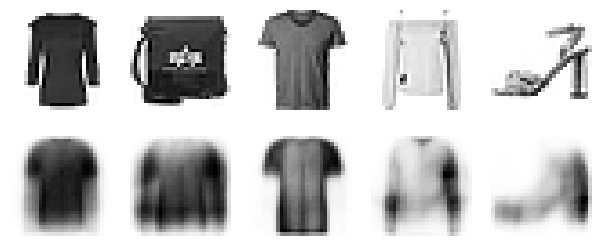

In [48]:
show_reconstructions(sparse_kl_ae)

In [ ]:
plot_activations_histogram(sparse_kl_encoder)
simpan_gambar("sparse_autoencoder_plot")
plt.show()

# Variational Autoencoder

In [ ]:
class Sampling(keras.layers.Layer):
    def call(self, inputs):
        mean, log_var = inputs
        return K.random_normal(tf.shape(log_var)) * K.exp(log_var / 2) + mean

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

codings_size = 10

inputs = keras.layers.Input(shape=[28, 28])
z = keras.layers.Flatten()(inputs)
z = keras.layers.Dense(150, activation="selu")(z)
z = keras.layers.Dense(100, activation="selu")(z)
codings_mean = keras.layers.Dense(codings_size)(z)
codings_log_var = keras.layers.Dense(codings_size)(z)
codings = Sampling()([codings_mean, codings_log_var])
variational_encoder = keras.models.Model(
    inputs=[inputs], outputs=[codings_mean, codings_log_var, codings])

decoder_inputs = keras.layers.Input(shape=[codings_size])
x = keras.layers.Dense(100, activation="selu")(decoder_inputs)
x = keras.layers.Dense(150, activation="selu")(x)
x = keras.layers.Dense(28 * 28, activation="sigmoid")(x)
outputs = keras.layers.Reshape([28, 28])(x)
variational_decoder = keras.models.Model(inputs=[decoder_inputs], outputs=[outputs])

_, _, codings = variational_encoder(inputs)
reconstructions = variational_decoder(codings)
variational_ae = keras.models.Model(inputs=[inputs], outputs=[reconstructions])

latent_loss = -0.5 * K.sum(
    1 + codings_log_var - K.exp(codings_log_var) - K.square(codings_mean),
    axis=-1)
variational_ae.add_loss(K.mean(latent_loss) / 784.)
variational_ae.compile(loss="binary_crossentropy", optimizer="rmsprop", metrics=[rounded_accuracy])
history = variational_ae.fit(X_train, X_train, epochs=25, batch_size=128,
                             validation_data=(X_valid, X_valid))

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_116']
Received: inputs=Tensor(shape=(5, 28, 28))
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_123']
Received: inputs=Tensor(shape=(5, 10))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 752ms/step


TypeError: Invalid shape (5, 28, 28) for image data

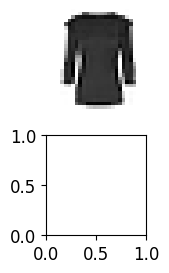

In [52]:
show_reconstructions(variational_ae)
plt.show()

## Generate Fashion Images

In [53]:
def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = np.squeeze(images, axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

Let's generate a few random codings, decode them and plot the resulting images:

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_123']
Received: inputs=Tensor(shape=(12, 10))
  warnings.warn(msg)


Saving gambarure vae_generated_images_plot


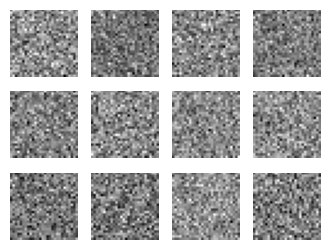

In [54]:
tf.random.set_seed(42)

codings = tf.random.normal(shape=[12, codings_size])
images = variational_decoder(codings).numpy()
plot_multiple_images(images, 4)
simpan_gambar("vae_generated_images_plot", tight_layout=False)

Now let's perform semantic interpolation between these images:

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_123']
Received: inputs=Tensor(shape=(35, 10))
  warnings.warn(msg)


Saving gambarure semantic_interpolation_plot


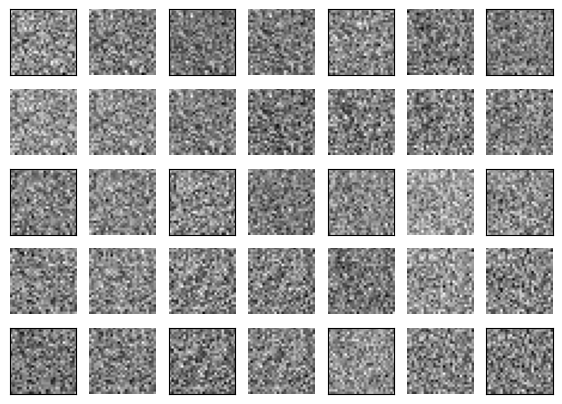

In [55]:
tf.random.set_seed(42)
np.random.seed(42)

codings_grid = tf.reshape(codings, [1, 3, 4, codings_size])
larger_grid = tf.image.resize(codings_grid, size=[5, 7])
interpolated_codings = tf.reshape(larger_grid, [-1, codings_size])
images = variational_decoder(interpolated_codings).numpy()

plt.figure(figsize=(7, 5))
for index, image in enumerate(images):
    plt.subplot(5, 7, index + 1)
    if index%7%2==0 and index//7%2==0:
        plt.gca().get_xaxis().set_visible(False)
        plt.gca().get_yaxis().set_visible(False)
    else:
        plt.axis("off")
    plt.imshow(image, cmap="binary")
simpan_gambar("semantic_interpolation_plot", tight_layout=False)

# Generative Adversarial Networks

In [56]:
np.random.seed(42)
tf.random.set_seed(42)

codings_size = 30

generator = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[codings_size]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
discriminator = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(1, activation="sigmoid")
])
gan = keras.models.Sequential([generator, discriminator])

In [57]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [58]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

In [59]:
def train_gan(gan, dataset, batch_size, codings_size, n_epochs=50):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))              # not shown in the book
        for X_batch in dataset:
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.trainable = True
            discriminator.train_on_batch(X_fake_and_real, y1)
            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            discriminator.trainable = False
            gan.train_on_batch(noise, y2)
        plot_multiple_images(generated_images, 8)                     # not shown
        plt.show()                                                    # not shown

Epoch 1/1


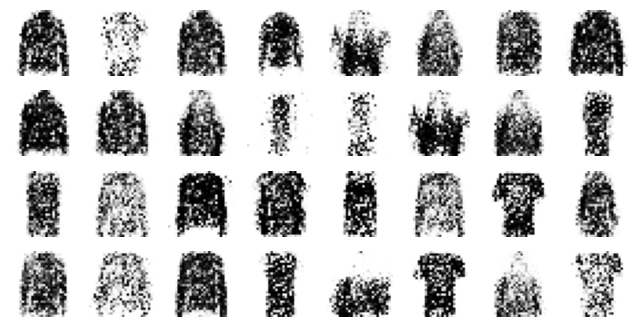

In [60]:
train_gan(gan, dataset, batch_size, codings_size, n_epochs=1)

Saving gambarure gan_generated_images_plot


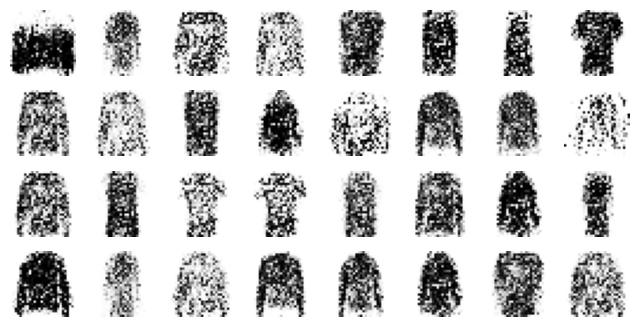

In [61]:
tf.random.set_seed(42)
np.random.seed(42)

noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator(noise)
plot_multiple_images(generated_images, 8)
simpan_gambar("gan_generated_images_plot", tight_layout=False)

Epoch 1/50


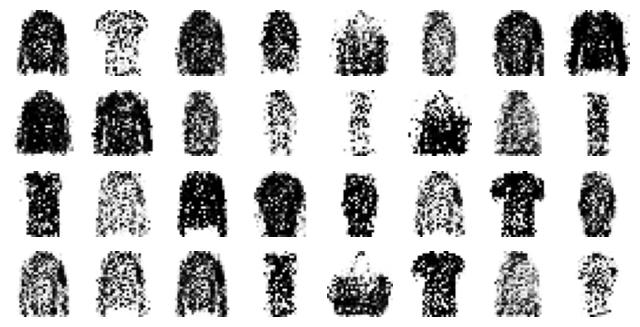

Epoch 2/50


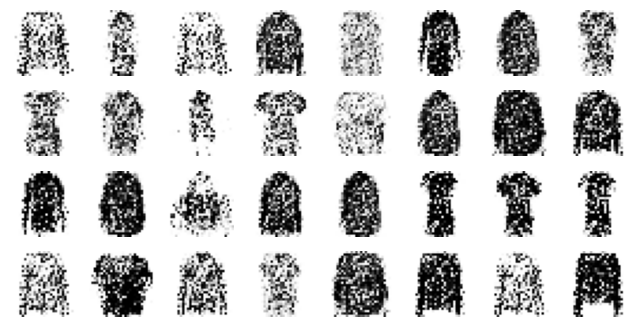

Epoch 3/50


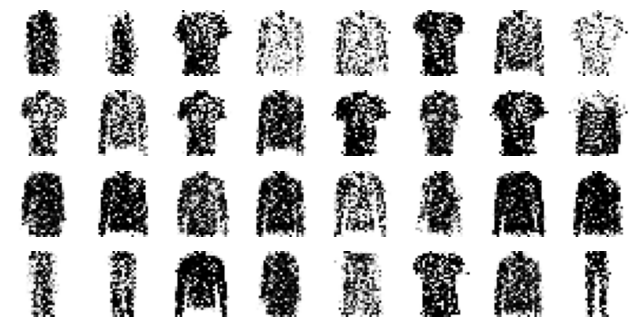

Epoch 4/50


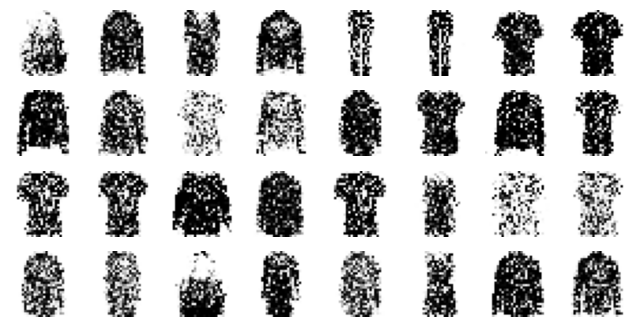

Epoch 5/50


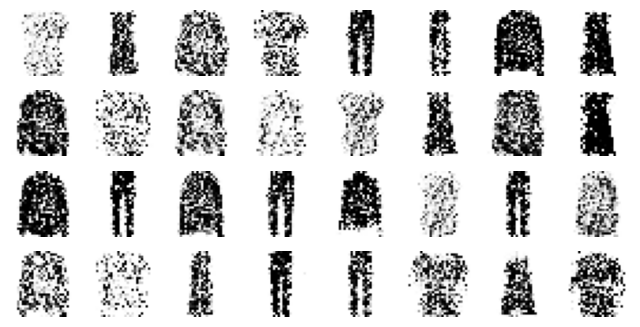

Epoch 6/50


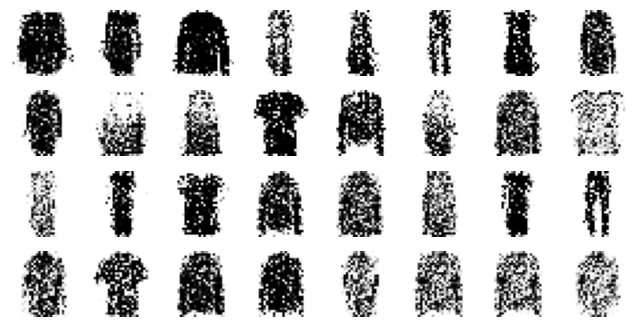

Epoch 7/50


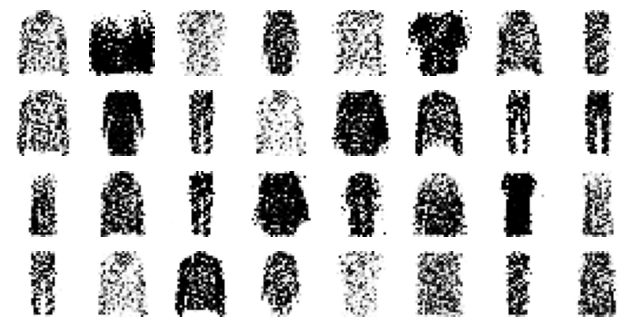

Epoch 8/50


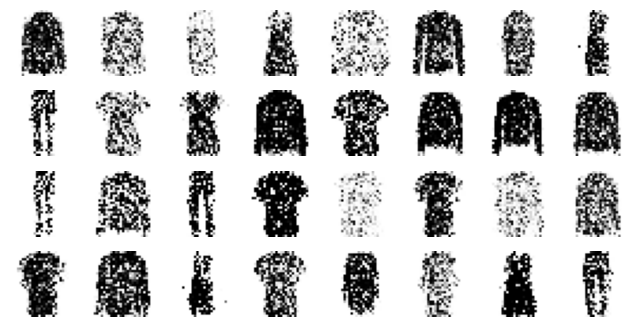

Epoch 9/50


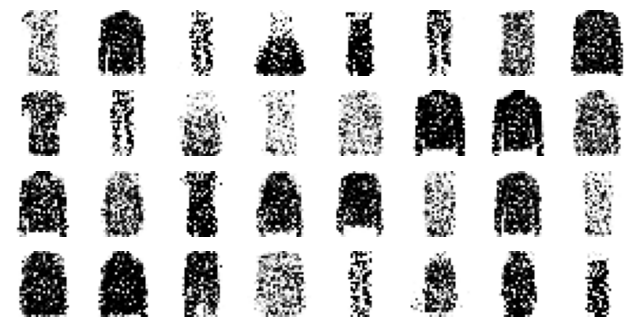

Epoch 10/50


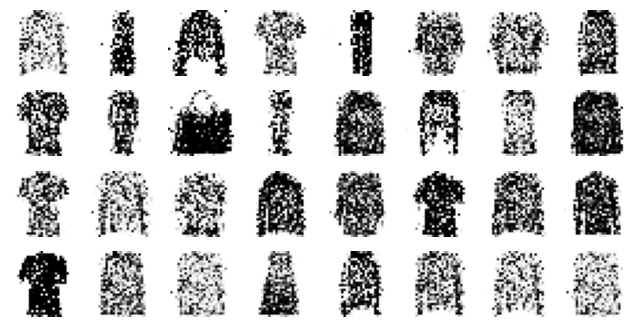

Epoch 11/50


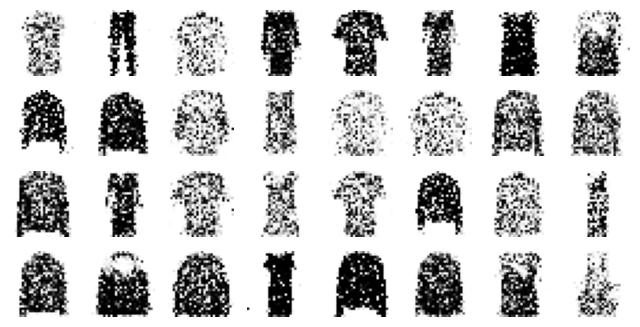

Epoch 12/50


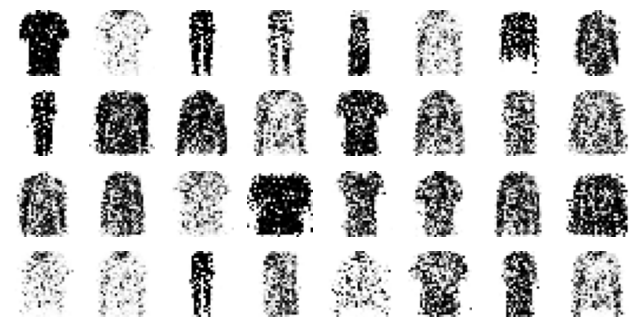

Epoch 13/50


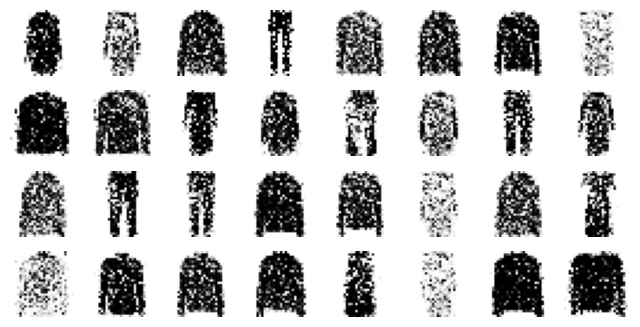

Epoch 14/50


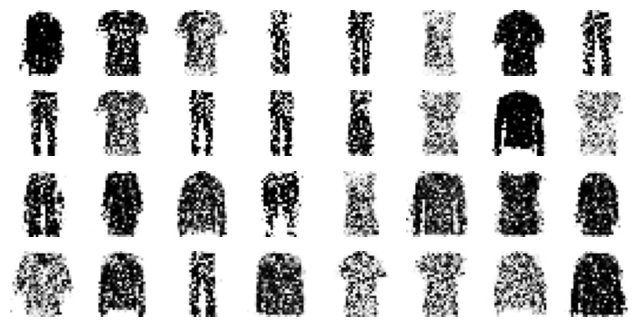

Epoch 15/50


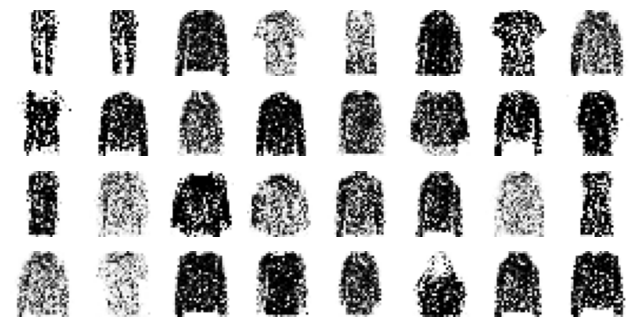

Epoch 16/50


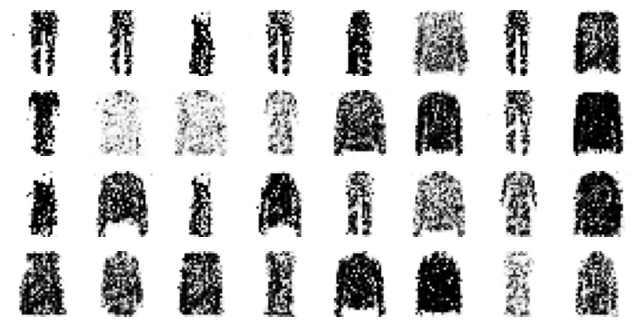

Epoch 17/50


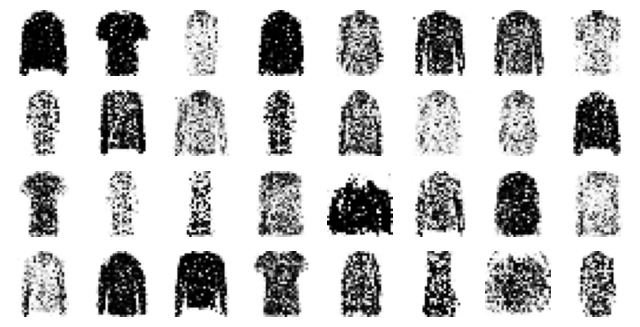

Epoch 18/50


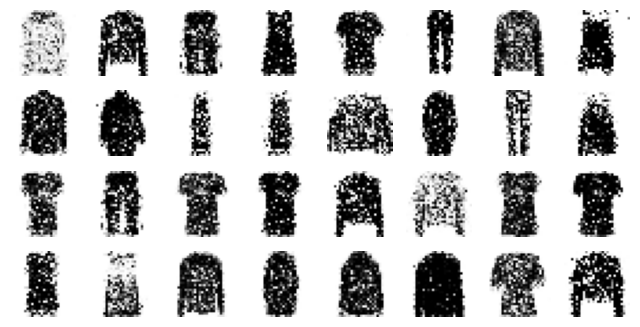

Epoch 19/50


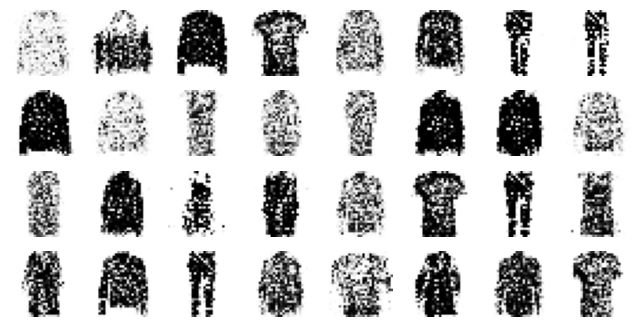

Epoch 20/50


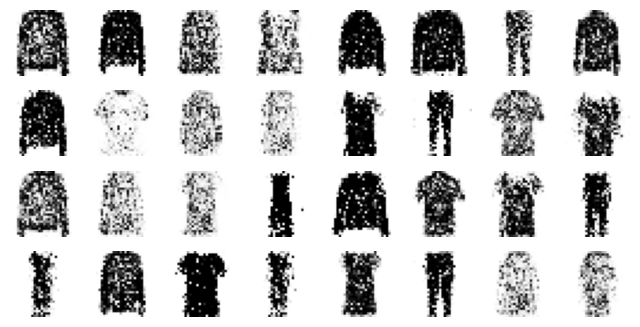

Epoch 21/50


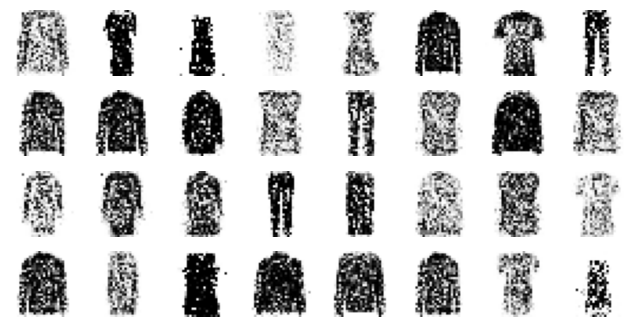

Epoch 22/50


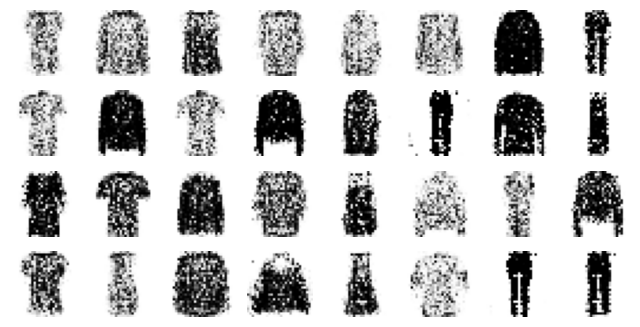

Epoch 23/50


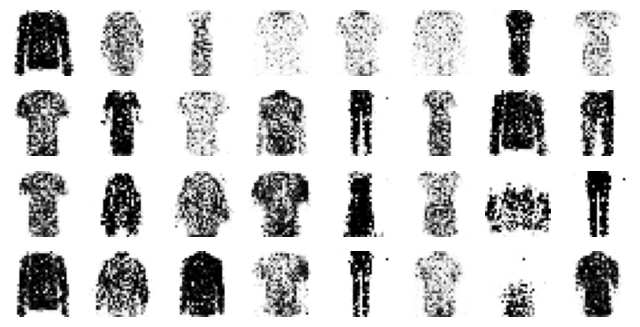

Epoch 24/50


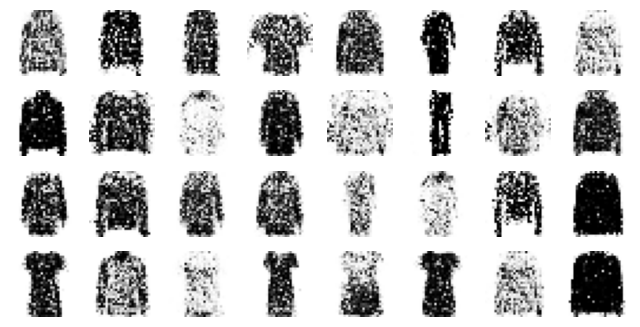

Epoch 25/50


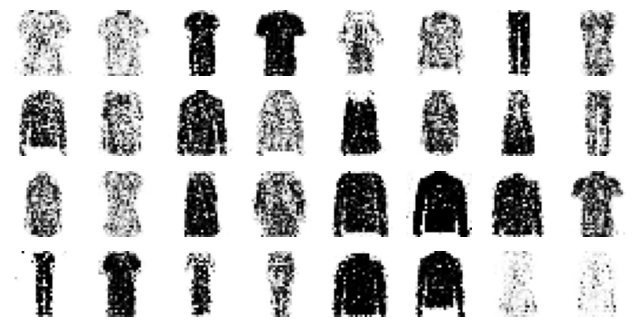

Epoch 26/50


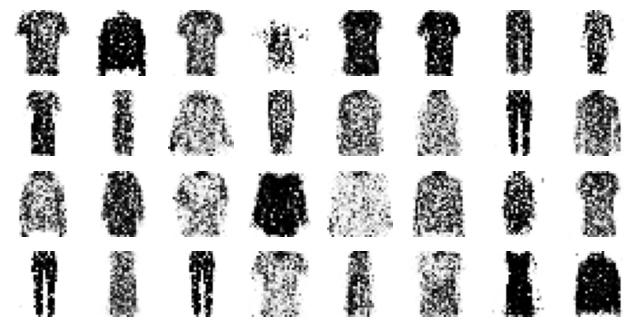

Epoch 27/50


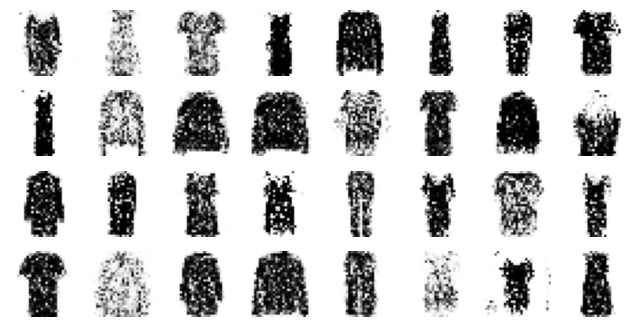

Epoch 28/50


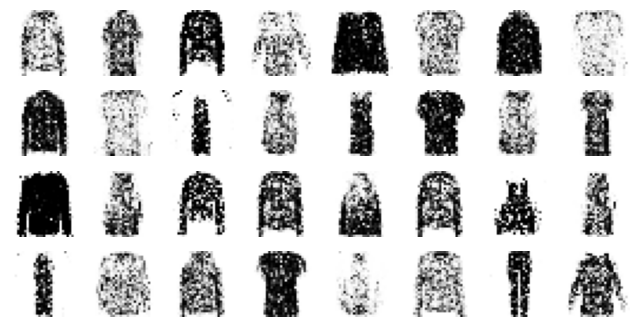

Epoch 29/50


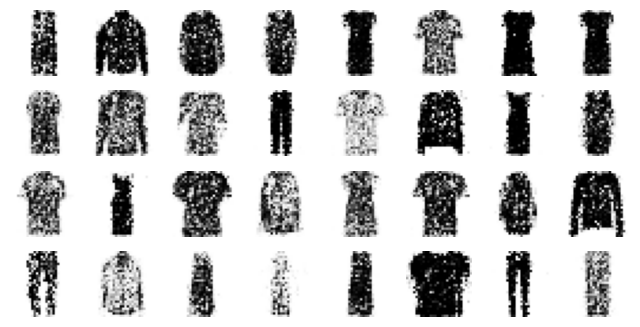

Epoch 30/50


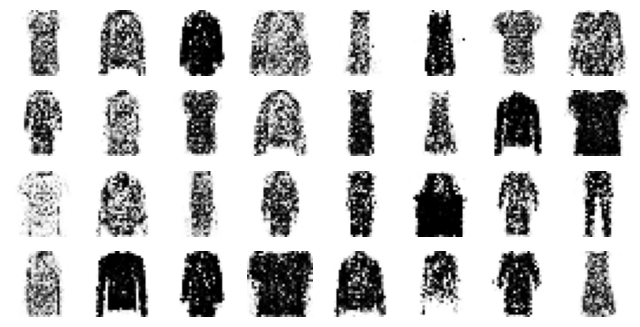

Epoch 31/50


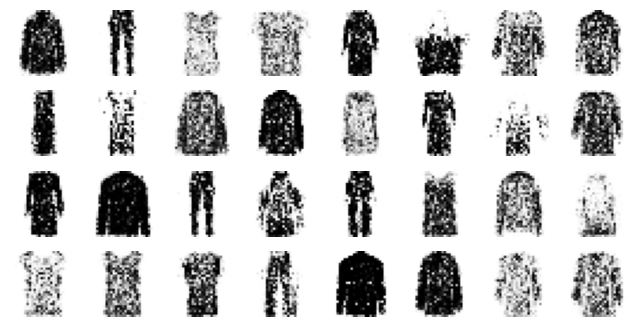

Epoch 32/50


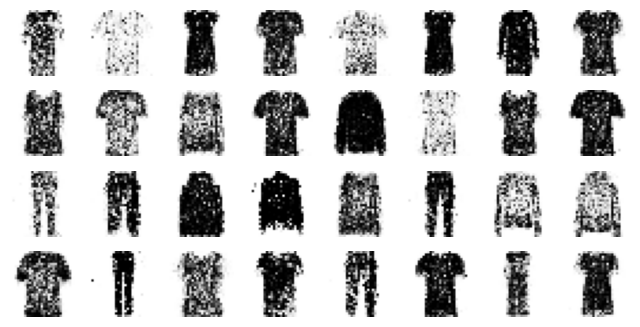

Epoch 33/50


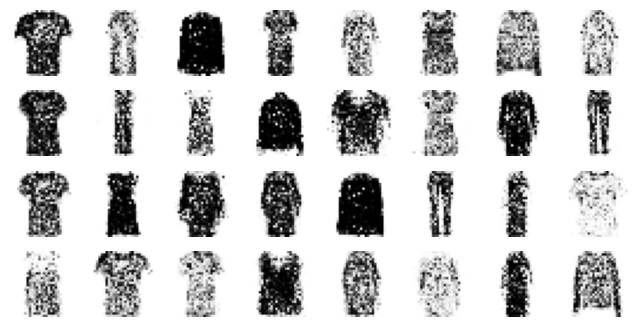

Epoch 34/50


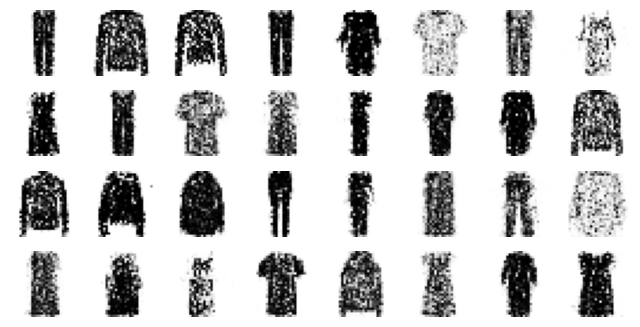

Epoch 35/50


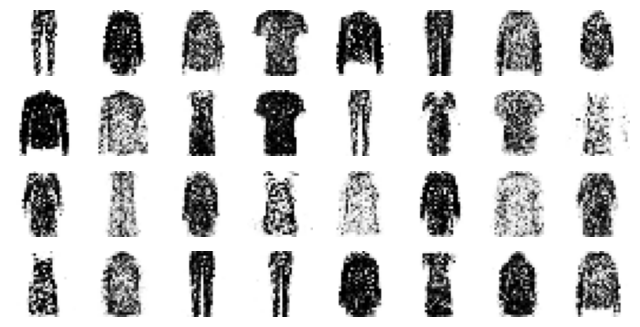

Epoch 36/50


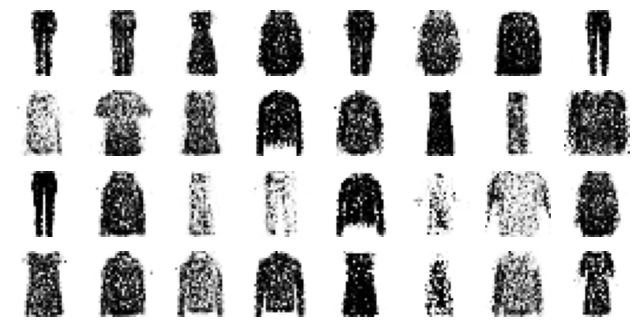

Epoch 37/50


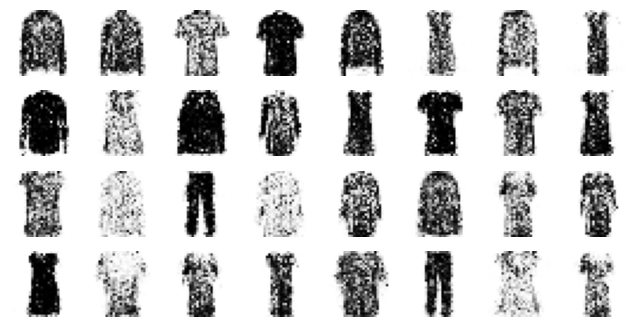

Epoch 38/50


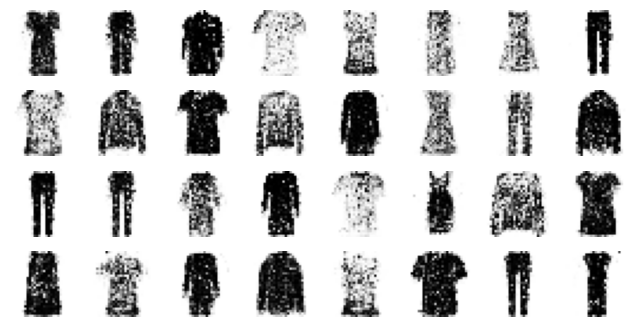

Epoch 39/50


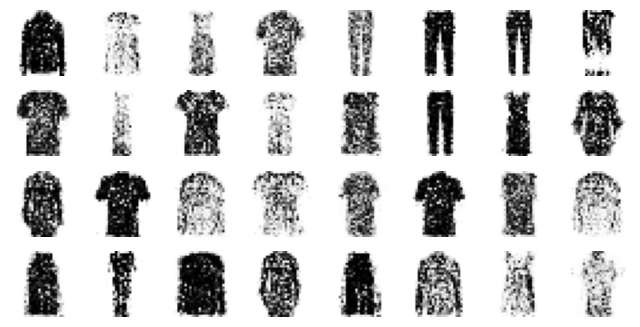

Epoch 40/50


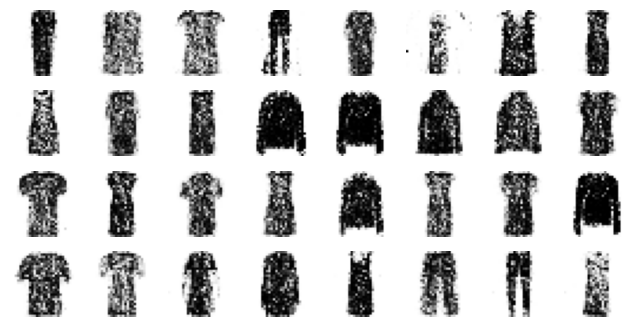

Epoch 41/50


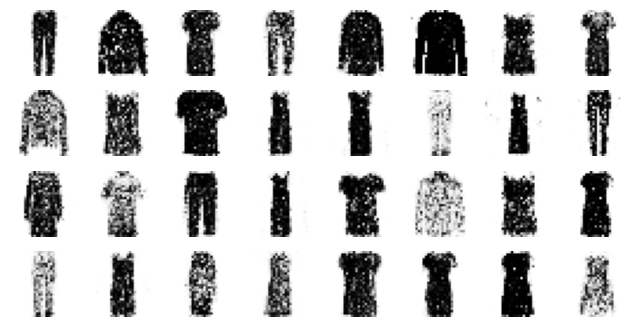

Epoch 42/50


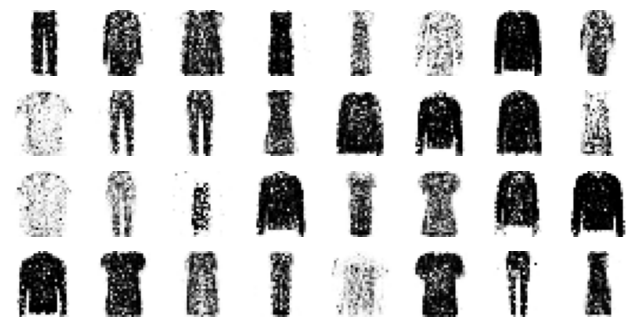

Epoch 43/50


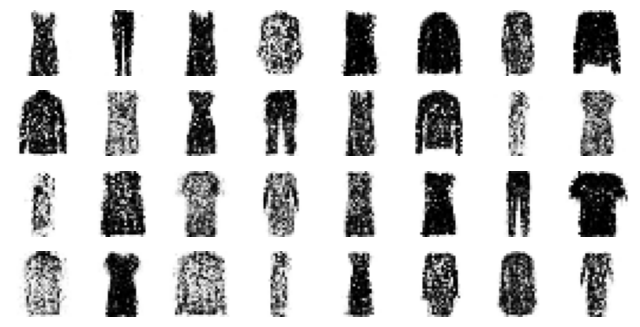

Epoch 44/50


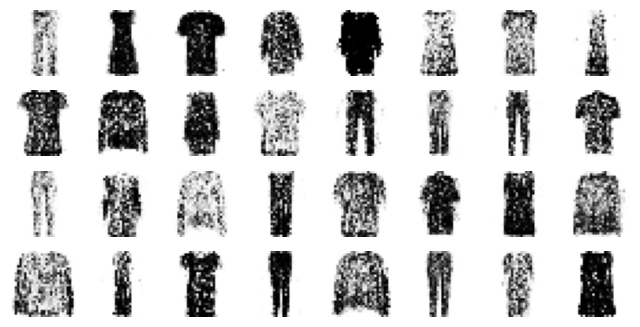

Epoch 45/50


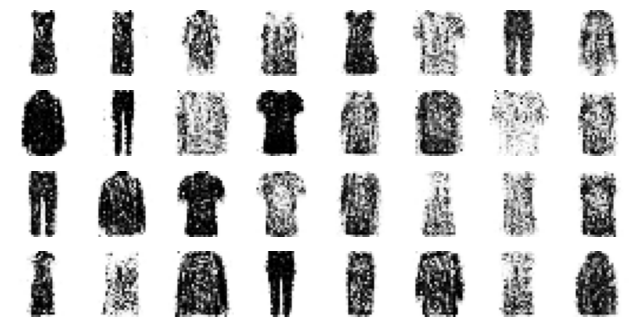

Epoch 46/50


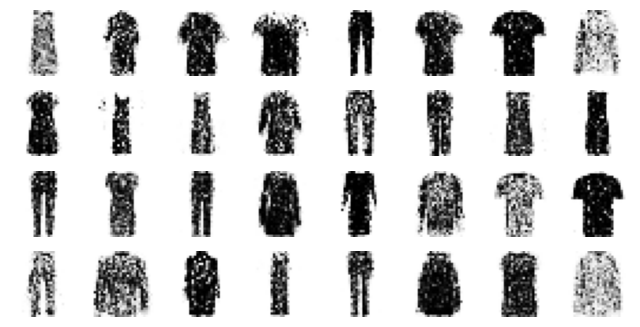

Epoch 47/50


In [ ]:
train_gan(gan, dataset, batch_size, codings_size)

# Deep Convolutional GAN

In [3]:
import numpy as np
import tensorflow as tf
from tensorflow import keras

tf.random.set_seed(42)
np.random.seed(42)

codings_size = 100

generator = keras.models.Sequential([
    keras.layers.Dense(7 * 7 * 128, input_shape=[codings_size]),
    keras.layers.Reshape([7, 7, 128]),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="SAME",
                                 activation="selu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding="SAME",
                                 activation="tanh"),
])

discriminator = keras.models.Sequential([
    keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2),
                        input_shape=[28, 28, 1]),
    keras.layers.Dropout(0.4),
    keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2)),
    keras.layers.Dropout(0.4),
    keras.layers.Flatten(),
    keras.layers.Dense(1, activation="sigmoid")
])

gan = keras.models.Sequential([generator, discriminator])


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [4]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [6]:
import numpy as np
import tensorflow as tf
from tensorflow import keras

# Load MNIST
(X_train, y_train), (X_test, y_test) = keras.datasets.mnist.load_data()

# Preprocessing: dari [0,255] ke [-1,1] dan tambah dimensi channel
X_train = X_train.astype("float32") / 255.
X_train_dcgan = X_train.reshape(-1, 28, 28, 1) * 2. - 1.


11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [7]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

In [10]:
# Fungsi untuk menghasilkan noise acak
def generate_latent_points(codings_size, n_samples):
    return tf.random.normal(shape=[n_samples, codings_size])

# Fungsi pelatihan DCGAN
def train_gan(gan, dataset, batch_size, codings_size, n_epochs=50):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print(f"Epoch {epoch + 1}/{n_epochs}")
        for X_batch in dataset:
            # 1. Buat noise
            noise = generate_latent_points(codings_size, batch_size)

            # 2. Buat citra palsu dari noise
            generated_images = generator(noise)

            # 3. Gabungkan citra nyata dan palsu
            combined_images = tf.concat([generated_images, X_batch], axis=0)

            # 4. Label: 0 untuk palsu, 1 untuk nyata
            labels = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)

            # 5. Tambahkan noise kecil ke label (label smoothing)
            labels += 0.05 * tf.random.uniform(tf.shape(labels))

            # 6. Latih discriminator
            discriminator.trainable = True
            d_loss = discriminator.train_on_batch(combined_images, labels)

            # 7. Buat noise baru untuk generator
            noise = generate_latent_points(codings_size, batch_size)
            misleading_labels = tf.constant([[1.]] * batch_size)

            # 8. Latih generator (melalui GAN)
            discriminator.trainable = False
            a_loss = gan.train_on_batch(noise, misleading_labels)

        print(f"Discriminator loss: {d_loss:.4f}, Adversarial loss: {a_loss:.4f}")


In [11]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(buffer_size=1000).batch(batch_size, drop_remainder=True).prefetch(1)


In [ ]:
train_gan(gan, dataset, batch_size=batch_size, codings_size=codings_size)


Epoch 1/50
Discriminator loss: 0.6199, Adversarial loss: 0.9091
Epoch 2/50
Discriminator loss: 0.6066, Adversarial loss: 0.9677
Epoch 3/50
Discriminator loss: 0.5918, Adversarial loss: 1.0355
Epoch 4/50
Discriminator loss: 0.5797, Adversarial loss: 1.0949
Epoch 5/50
Discriminator loss: 0.5712, Adversarial loss: 1.1388
Epoch 6/50
Discriminator loss: 0.5653, Adversarial loss: 1.1714
Epoch 7/50
Discriminator loss: 0.5613, Adversarial loss: 1.1950
Epoch 8/50


In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator(noise)
plot_multiple_images(generated_images, 8)
simpan_gambar("dcgan_generated_images_plot", tight_layout=False)

# Extra Material

## Hashing Using a Binary Autoencoder

Let's load the Fashion MNIST dataset again:

In [ ]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

hashing_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.GaussianNoise(15.),
    keras.layers.Dense(16, activation="sigmoid"),
])
hashing_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[16]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
hashing_ae = keras.models.Sequential([hashing_encoder, hashing_decoder])
hashing_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.Nadam(),
                   metrics=[rounded_accuracy])
history = hashing_ae.fit(X_train, X_train, epochs=10,
                         validation_data=(X_valid, X_valid))

The autoencoder compresses the information so much (down to 16 bits!) that it's quite lossy, but that's okay, we're using it to produce semantic hashes, not to perfectly reconstruct the images:

In [ ]:
show_reconstructions(hashing_ae)
plt.show()

Notice that the outputs are indeed very close to 0 or 1 (left graph):

In [ ]:
plot_activations_histogram(hashing_encoder)
plt.show()

Now let's see what the hashes look like for the first few images in the validation set:

In [ ]:
hashes = np.round(hashing_encoder.predict(X_valid)).astype(np.int32)
hashes *= np.array([[2**bit for bit in range(16)]])
hashes = hashes.sum(axis=1)
for h in hashes[:5]:
    print("{:016b}".format(h))
print("...")

Now let's find the most common image hashes in the validation set, and display a few images for each hash. In the following image, all the images on a given row have the same hash:

In [ ]:
from collections import Counter

n_hashes = 10
n_images = 8

top_hashes = Counter(hashes).most_common(n_hashes)

plt.figure(figsize=(n_images, n_hashes))
for hash_index, (image_hash, hash_count) in enumerate(top_hashes):
    indices = (hashes == image_hash)
    for index, image in enumerate(X_valid[indices][:n_images]):
        plt.subplot(n_hashes, n_images, hash_index * n_images + index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

# Exercise

In [ ]:
[X_train, y_train], [X_test, y_test] = keras.datasets.cifar10.load_data()
X_train = X_train / 255
X_test = X_test / 255

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

denoising_encoder = keras.models.Sequential([
    keras.layers.GaussianNoise(0.1, input_shape=[32, 32, 3]),
    keras.layers.Conv2D(32, kernel_size=3, padding="same", activation="relu"),
    keras.layers.MaxPool2D(),
    keras.layers.Flatten(),
    keras.layers.Dense(512, activation="relu"),
])

In [ ]:
denoising_encoder.summary()

In [ ]:
denoising_decoder = keras.models.Sequential([
    keras.layers.Dense(16 * 16 * 32, activation="relu", input_shape=[512]),
    keras.layers.Reshape([16, 16, 32]),
    keras.layers.Conv2DTranspose(filters=3, kernel_size=3, strides=2,
                                 padding="same", activation="sigmoid")
])

In [ ]:
denoising_decoder.summary()

In [ ]:
denoising_ae = keras.models.Sequential([denoising_encoder, denoising_decoder])
denoising_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.Nadam(),
                     metrics=["mse"])
history = denoising_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_test, X_test))

In [ ]:
n_images = 5
new_images = X_test[:n_images]
new_images_noisy = new_images + np.random.randn(n_images, 32, 32, 3) * 0.1
new_images_denoised = denoising_ae.predict(new_images_noisy)

plt.figure(figsize=(6, n_images * 2))
for index in range(n_images):
    plt.subplot(n_images, 3, index * 3 + 1)
    plt.imshow(new_images[index])
    plt.axis('off')
    if index == 0:
        plt.title("Original")
    plt.subplot(n_images, 3, index * 3 + 2)
    plt.imshow(np.clip(new_images_noisy[index], 0., 1.))
    plt.axis('off')
    if index == 0:
        plt.title("Noisy")
    plt.subplot(n_images, 3, index * 3 + 3)
    plt.imshow(new_images_denoised[index])
    plt.axis('off')
    if index == 0:
        plt.title("Denoised")
plt.show()


---

# 📘 **Chapter 17: Autoencoders and GANs**

---

## 🔷 **1. Autoencoders: Teori Dasar**

### ✅ **Apa itu Autoencoder?**

Autoencoder adalah jenis neural network yang digunakan untuk:

* **Belajar representasi kompresi (encoding)** dari data input.
* **Kemudian mengembalikan (decode)** data tersebut sedekat mungkin dengan input aslinya.

### ✅ **Struktur Umum:**

* **Encoder**: Memetakan input berdimensi tinggi → latent vector berdimensi lebih rendah.
* **Decoder**: Memetakan latent vector → merekonstruksi kembali ke bentuk seperti input.

```python
encoder = keras.models.Sequential([...])
decoder = keras.models.Sequential([...])
autoencoder = keras.models.Sequential([encoder, decoder])
```

### ✅ **Loss Function:**

* Biasanya digunakan **Mean Squared Error (MSE)** atau **Binary Crossentropy** tergantung tipe datanya.

```python
autoencoder.compile(loss="binary_crossentropy", ...)
```

---

## 🔷 **2. Tied Weights Autoencoder**

### ✅ **Apa itu Tied Weights?**

Tied Weights berarti:

* Bobot pada decoder adalah **transpos dari bobot encoder**.
* Ini mengurangi jumlah parameter yang harus dipelajari → membuat model lebih stabil.

### ✅ **Implementasi di Kode:**

```python
class DenseTranspose(keras.layers.Layer):
    ...
    def build(self, batch_input_shape):
        self.weights_ = self.dense.weights[0]  # ambil bobot dari encoder
        ...
```

```python
tied_encoder = keras.models.Sequential([...])
tied_decoder = keras.models.Sequential([
    DenseTranspose(dense_2),  # Transpose layer dari encoder
    DenseTranspose(dense_1),
    Reshape([28, 28])
])
```

---

## 🔷 **3. Variational Autoencoder (VAE)** – (Opsional di kode)

> Tidak muncul di kode kamu, tapi ini bagian teori penting Chapter 17.

### ✅ **Tujuan VAE:**

Membuat encoder bukan hanya menghasilkan satu titik (latent vector), tapi **distribusi** (mean dan stddev), agar output lebih bervariasi dan teratur.

### ✅ **Menggunakan Kullback–Leibler Divergence** dalam loss untuk memastikan distribusi mendekati Gaussian.

---

## 🔷 **4. Generative Adversarial Networks (GANs)**

### ✅ **Inti dari GAN:**

GAN adalah arsitektur dengan **dua jaringan neural**:

1. **Generator**: Menciptakan data palsu dari noise.
2. **Discriminator**: Membedakan mana data asli dan mana data hasil generator.

```python
gan = keras.models.Sequential([generator, discriminator])
```

### ✅ **Latihan Adversarial:**

* **Discriminator** dilatih untuk membedakan `real` dan `fake`.
* **Generator** dilatih untuk **menipu** discriminator.

---

## 🔷 **5. Arsitektur Generator & Discriminator (DCGAN Style)**

### ✅ **Generator:**

* Input: Noise (misal: `tf.random.normal(shape=[batch_size, codings_size])`)
* Layer:

  * Dense → Reshape → Conv2DTranspose + BatchNorm + Activation
  * Output activation: `tanh` (output dalam rentang \[-1, 1])

```python
generator = keras.models.Sequential([
    Dense(...), Reshape(...),
    Conv2DTranspose(...), ...
])
```

### ✅ **Discriminator:**

* Input: Gambar nyata / palsu
* Layer:

  * Conv2D → LeakyReLU → Dropout
  * Diakhiri dengan Dense(1, sigmoid)

```python
discriminator = keras.models.Sequential([
    Conv2D(...), Dropout(...), Dense(1, activation="sigmoid")
])
```

---

## 🔷 **6. Proses Pelatihan GAN**

### ✅ **Langkah-langkah:**

1. **Buat noise → generator → gambar palsu**
2. **Gabungkan dengan gambar nyata**
3. **Latih discriminator → membedakan nyata vs palsu**
4. **Latih generator → menipu discriminator**

### ✅ **Custom Training Loop:**

```python
for epoch in range(n_epochs):
    for batch in dataset:
        # Step 1: Train discriminator
        ...
        # Step 2: Train generator (via gan model)
        ...
```

### ✅ **Label Smoothing (Trik Stabilitas):**

Menambahkan sedikit noise ke label supaya pelatihan lebih stabil.

```python
labels += 0.05 * tf.random.uniform(tf.shape(labels))
```

---

## 🔷 **7. Preprocessing dan Dataset**

### ✅ Dataset: MNIST

* Di-normalisasi ke \[0, 1]
* Disesuaikan ke \[-1, 1] (karena `tanh` output generator)

```python
X_train = X_train.astype("float32") / 255.
X_train_dcgan = X_train.reshape(-1, 28, 28, 1) * 2. - 1.
```

---

## 🔷 **8. Evaluasi GAN**

* GAN tidak dievaluasi dengan akurasi.
* Biasanya digunakan:

  * Visualisasi hasil generator
  * Inception Score, FID (Fréchet Inception Distance), dsb. → tapi belum diimplementasi di kode.

---

## 🔷 **9. Tips dan Trik Praktis**

| Trik                       | Tujuan                                       |
| -------------------------- | -------------------------------------------- |
| Label smoothing            | Bantu stabilisasi pelatihan discriminator    |
| Dropout di discriminator   | Kurangi overfitting & bantu generalisasi     |
| BatchNorm di generator     | Bantu stabilisasi dan konvergensi            |
| LeakyReLU di discriminator | Mencegah dying ReLU                          |
| Tanh di output generator   | Karena input data distandarisasi di \[-1, 1] |

---

# ✅ **Kesimpulan**

* **Autoencoder** berguna untuk representasi dan rekonstruksi data.
* **Tied Autoencoder** mengurangi parameter dan lebih efisien.
* **GAN** memungkinkan kita menciptakan gambar baru dari noise acak.
* **DCGAN** menggunakan CNN untuk meningkatkan kualitas gambar.
* **Training GAN** memerlukan loop kustom, pemisahan pelatihan discriminator dan generator.

---
